In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import folium
import geopandas as gpd
from shapely.geometry import Point, LineString
from geopy.distance import geodesic
from scipy.stats import zscore

In [2]:
ds = pd.read_csv("DataSample.csv", index_col = False)
ds

,_ID,TimeSt,Country,Province,City,Latitude,Longitude
0,4516516,2017-06-21 00:00:00.143,CA,ON,Waterloo,43.49347,-80.49123
1,4516547,2017-06-21 18:00:00.193,CA,ON,London,42.93990,-81.27090
2,4516550,2017-06-21 15:00:00.287,CA,ON,Guelph,43.57760,-80.22010
3,4516600,2017-06-21 15:00:00.307,CA,ON,Stratford,43.37160,-80.97730
4,4516613,2017-06-21 15:00:00.497,CA,ON,Stratford,43.37160,-80.97730
...,...,...,...,...,...,...,...
22020,5614801,2017-06-21 12:23:07.880,CA,ON,Saint Catharines,43.16440,-79.24560
22021,5614888,2017-06-21 08:23:01.793,CA,AB,Calgary,51.02093,-114.10621
22022,5614909,2017-06-21 00:23:07.903,CA,ON,Whitby,43.88730,-78.94220
22023,5614912,2017-06-21 11:23:07.953,CA,ON,Oakville,43.49340,-79.71260


In [3]:
poi = pd.read_csv("POIList.csv", index_col = False)
poi

#POI1 and POI2 are duplicates

,POIID,Latitude,Longitude
0,POI1,53.546167,-113.485734
1,POI2,53.546167,-113.485734
2,POI3,45.521629,-73.566024
3,POI4,45.224830,-63.232729


### Task 1: Cleanup

In [4]:
#exploring POI dataset: changing inconvenient column names

poi = poi.rename(columns = {' Latitude':'Latitude'}, inplace = False)
poi.info

<bound method DataFrame.info of   POIID   Latitude   Longitude
0  POI1  53.546167 -113.485734
1  POI2  53.546167 -113.485734
2  POI3  45.521629  -73.566024
3  POI4  45.224830  -63.232729>

In [5]:
#removing the duplicated location POI2 and renaming POI1
poi.drop(poi.index[1], inplace = True)
poi

,POIID,Latitude,Longitude
0,POI1,53.546167,-113.485734
2,POI3,45.521629,-73.566024
3,POI4,45.224830,-63.232729


In [6]:
#exploring DataSample dataset
pd.isnull(ds).sum()

_ID          0
 TimeSt      0
Country      0
Province     0
City         0
Latitude     0
Longitude    0
dtype: int64

In [7]:
#exploring DataSample dataset vol 2
ds.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22025 entries, 0 to 22024
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   _ID        22025 non-null  int64  
 1    TimeSt    22025 non-null  object 
 2   Country    22025 non-null  object 
 3   Province   22025 non-null  object 
 4   City       22025 non-null  object 
 5   Latitude   22025 non-null  float64
 6   Longitude  22025 non-null  float64
dtypes: float64(2), int64(1), object(4)
memory usage: 1.2+ MB


In [8]:
#exploring DataSample dataset vol 3: renaming inconveniently named indexes
ds = ds.rename(columns = {' TimeSt':'timest'}, inplace = False)
ds

,_ID,timest,Country,Province,City,Latitude,Longitude
0,4516516,2017-06-21 00:00:00.143,CA,ON,Waterloo,43.49347,-80.49123
1,4516547,2017-06-21 18:00:00.193,CA,ON,London,42.93990,-81.27090
2,4516550,2017-06-21 15:00:00.287,CA,ON,Guelph,43.57760,-80.22010
3,4516600,2017-06-21 15:00:00.307,CA,ON,Stratford,43.37160,-80.97730
4,4516613,2017-06-21 15:00:00.497,CA,ON,Stratford,43.37160,-80.97730
...,...,...,...,...,...,...,...
22020,5614801,2017-06-21 12:23:07.880,CA,ON,Saint Catharines,43.16440,-79.24560
22021,5614888,2017-06-21 08:23:01.793,CA,AB,Calgary,51.02093,-114.10621
22022,5614909,2017-06-21 00:23:07.903,CA,ON,Whitby,43.88730,-78.94220
22023,5614912,2017-06-21 11:23:07.953,CA,ON,Oakville,43.49340,-79.71260


In [9]:
#exploring DataSample dataset vol 4: finding duplicates 
ds.duplicated(subset = ['timest', 'Latitude', 'Longitude'], keep = 'first').sum()

2026

In [10]:
#exploring DataSample dataset vol 4: eliminating duplicates
ds_dd = ds.drop_duplicates(subset = ['timest', 'Latitude', 'Longitude'], keep = 'last')
ds_dd

,_ID,timest,Country,Province,City,Latitude,Longitude
0,4516516,2017-06-21 00:00:00.143,CA,ON,Waterloo,43.49347,-80.49123
1,4516547,2017-06-21 18:00:00.193,CA,ON,London,42.93990,-81.27090
2,4516550,2017-06-21 15:00:00.287,CA,ON,Guelph,43.57760,-80.22010
3,4516600,2017-06-21 15:00:00.307,CA,ON,Stratford,43.37160,-80.97730
4,4516613,2017-06-21 15:00:00.497,CA,ON,Stratford,43.37160,-80.97730
...,...,...,...,...,...,...,...
22020,5614801,2017-06-21 12:23:07.880,CA,ON,Saint Catharines,43.16440,-79.24560
22021,5614888,2017-06-21 08:23:01.793,CA,AB,Calgary,51.02093,-114.10621
22022,5614909,2017-06-21 00:23:07.903,CA,ON,Whitby,43.88730,-78.94220
22023,5614912,2017-06-21 11:23:07.953,CA,ON,Oakville,43.49340,-79.71260


### Task 2: Label

In [11]:
#geo: transforming 'Latitude' and 'Longitude' to 'geometry'

#Option 1
#gdf_ds_dd = gpd.GeoDataFrame(ds_dd, geometry=gpd.points_from_xy(ds_dd['Longitude'], ds_dd['Latitude']))
#gdf_poi = gpd.GeoDataFrame(poi, geometry=gpd.points_from_xy(poi['Longitude'], poi['Latitude']))

#Option 2
def new_gdf(df, x="Longitude", y="Latitude"):
    return gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df[x], df[y]))


In [12]:
gdf_ds_dd = new_gdf(ds_dd)
gdf_ds_dd

,_ID,timest,Country,Province,City,Latitude,Longitude,geometry
0,4516516,2017-06-21 00:00:00.143,CA,ON,Waterloo,43.49347,-80.49123,POINT (-80.49123 43.49347)
1,4516547,2017-06-21 18:00:00.193,CA,ON,London,42.93990,-81.27090,POINT (-81.27090 42.93990)
2,4516550,2017-06-21 15:00:00.287,CA,ON,Guelph,43.57760,-80.22010,POINT (-80.22010 43.57760)
3,4516600,2017-06-21 15:00:00.307,CA,ON,Stratford,43.37160,-80.97730,POINT (-80.97730 43.37160)
4,4516613,2017-06-21 15:00:00.497,CA,ON,Stratford,43.37160,-80.97730,POINT (-80.97730 43.37160)
...,...,...,...,...,...,...,...,...
22020,5614801,2017-06-21 12:23:07.880,CA,ON,Saint Catharines,43.16440,-79.24560,POINT (-79.24560 43.16440)
22021,5614888,2017-06-21 08:23:01.793,CA,AB,Calgary,51.02093,-114.10621,POINT (-114.10621 51.02093)
22022,5614909,2017-06-21 00:23:07.903,CA,ON,Whitby,43.88730,-78.94220,POINT (-78.94220 43.88730)
22023,5614912,2017-06-21 11:23:07.953,CA,ON,Oakville,43.49340,-79.71260,POINT (-79.71260 43.49340)


In [13]:
gdf_poi = new_gdf(poi)
gdf_poi

,POIID,Latitude,Longitude,geometry
0,POI1,53.546167,-113.485734,POINT (-113.48573 53.54617)
2,POI3,45.521629,-73.566024,POINT (-73.56602 45.52163)
3,POI4,45.224830,-63.232729,POINT (-63.23273 45.22483)


In [14]:
# Assigning nearest values 

gdf_ds_dd['key'] = gdf_ds_dd.apply(lambda x: ((x['Latitude'] - gdf_poi['Latitude']).abs() + (x['Longitude'] - gdf_poi['Longitude']).abs()).idxmin(), axis=1)
gdf_ds_dd = pd.merge(gdf_ds_dd, gdf_poi[['POIID','geometry','Latitude','Longitude']], how='left', left_on='key', right_index=True).drop('key', axis=1)
gdf_ds_dd

,_ID,timest,Country,Province,City,Latitude_x,Longitude_x,geometry_x,POIID,geometry_y,Latitude_y,Longitude_y
0,4516516,2017-06-21 00:00:00.143,CA,ON,Waterloo,43.49347,-80.49123,POINT (-80.49123 43.49347),POI3,POINT (-73.56602 45.52163),45.521629,-73.566024
1,4516547,2017-06-21 18:00:00.193,CA,ON,London,42.93990,-81.27090,POINT (-81.27090 42.93990),POI3,POINT (-73.56602 45.52163),45.521629,-73.566024
2,4516550,2017-06-21 15:00:00.287,CA,ON,Guelph,43.57760,-80.22010,POINT (-80.22010 43.57760),POI3,POINT (-73.56602 45.52163),45.521629,-73.566024
3,4516600,2017-06-21 15:00:00.307,CA,ON,Stratford,43.37160,-80.97730,POINT (-80.97730 43.37160),POI3,POINT (-73.56602 45.52163),45.521629,-73.566024
4,4516613,2017-06-21 15:00:00.497,CA,ON,Stratford,43.37160,-80.97730,POINT (-80.97730 43.37160),POI3,POINT (-73.56602 45.52163),45.521629,-73.566024
...,...,...,...,...,...,...,...,...,...,...,...,...
22020,5614801,2017-06-21 12:23:07.880,CA,ON,Saint Catharines,43.16440,-79.24560,POINT (-79.24560 43.16440),POI3,POINT (-73.56602 45.52163),45.521629,-73.566024
22021,5614888,2017-06-21 08:23:01.793,CA,AB,Calgary,51.02093,-114.10621,POINT (-114.10621 51.02093),POI1,POINT (-113.48573 53.54617),53.546167,-113.485734
22022,5614909,2017-06-21 00:23:07.903,CA,ON,Whitby,43.88730,-78.94220,POINT (-78.94220 43.88730),POI3,POINT (-73.56602 45.52163),45.521629,-73.566024
22023,5614912,2017-06-21 11:23:07.953,CA,ON,Oakville,43.49340,-79.71260,POINT (-79.71260 43.49340),POI3,POINT (-73.56602 45.52163),45.521629,-73.566024


In [15]:
gdf_ds_dd.rename(columns={'_ID' : 'id', 'POIID' : 'poi_name'}, inplace=True)

### Task 3: Analysis

In [16]:
# Measuring the distance between DataSample locations and POI locations using geopy

def distance(row):
    point1 = (row["Latitude_x"], row["Longitude_x"])
    point2 = (row["Latitude_y"], row["Longitude_y"])
    try: 
        return (geodesic(point1, point2).km) 
    except ValueError: return np.nan  

In [17]:
gdf_ds_dd['km'] = gdf_ds_dd.apply(lambda row: distance(row), axis = 1 )
gdf_ds_dd

,id,timest,Country,Province,City,Latitude_x,Longitude_x,geometry_x,poi_name,geometry_y,Latitude_y,Longitude_y,km
0,4516516,2017-06-21 00:00:00.143,CA,ON,Waterloo,43.49347,-80.49123,POINT (-80.49123 43.49347),POI3,POINT (-73.56602 45.52163),45.521629,-73.566024,594.764453
1,4516547,2017-06-21 18:00:00.193,CA,ON,London,42.93990,-81.27090,POINT (-81.27090 42.93990),POI3,POINT (-73.56602 45.52163),45.521629,-73.566024,678.755025
2,4516550,2017-06-21 15:00:00.287,CA,ON,Guelph,43.57760,-80.22010,POINT (-80.22010 43.57760),POI3,POINT (-73.56602 45.52163),45.521629,-73.566024,570.947304
3,4516600,2017-06-21 15:00:00.307,CA,ON,Stratford,43.37160,-80.97730,POINT (-80.97730 43.37160),POI3,POINT (-73.56602 45.52163),45.521629,-73.566024,636.181718
4,4516613,2017-06-21 15:00:00.497,CA,ON,Stratford,43.37160,-80.97730,POINT (-80.97730 43.37160),POI3,POINT (-73.56602 45.52163),45.521629,-73.566024,636.181718
...,...,...,...,...,...,...,...,...,...,...,...,...,...
22020,5614801,2017-06-21 12:23:07.880,CA,ON,Saint Catharines,43.16440,-79.24560,POINT (-79.24560 43.16440),POI3,POINT (-73.56602 45.52163),45.521629,-73.566024,523.007821
22021,5614888,2017-06-21 08:23:01.793,CA,AB,Calgary,51.02093,-114.10621,POINT (-114.10621 51.02093),POI1,POINT (-113.48573 53.54617),53.546167,-113.485734,284.159333
22022,5614909,2017-06-21 00:23:07.903,CA,ON,Whitby,43.88730,-78.94220,POINT (-78.94220 43.88730),POI3,POINT (-73.56602 45.52163),45.521629,-73.566024,463.037698
22023,5614912,2017-06-21 11:23:07.953,CA,ON,Oakville,43.49340,-79.71260,POINT (-79.71260 43.49340),POI3,POINT (-73.56602 45.52163),45.521629,-73.566024,538.037550


In [18]:
#calculating the mean and standard deviation of POI (poi_name) in the DataSample(gdf_ds_dd)
km_std_m = {'km': [('km_mean','mean'), ('km_std','std')]}

In [19]:
ds_grouped = gdf_ds_dd.groupby(['poi_name', 'Latitude_y', 'Longitude_y']).agg(km_std_m)
ds_grouped

km             
                                    km_mean       km_std
poi_name Latitude_y Longitude_y                         
POI1     53.546167  -113.485734  291.834041   280.742481
POI3     45.521629  -73.566024   454.852759   229.097390
POI4     45.224830  -63.232729   694.719642  2186.747786

In [20]:
ds_grouped.columns=ds_grouped.columns.map('_'.join)
ds_grouped

,,,km_km_mean,km_km_std
poi_name,Latitude_y,Longitude_y,,
POI1,53.546167,-113.485734,291.834041,280.742481
POI3,45.521629,-73.566024,454.852759,229.097390
POI4,45.224830,-63.232729,694.719642,2186.747786


In [21]:
ds_grouped.reset_index(inplace = True)

In [22]:
ds_grouped

,poi_name,Latitude_y,Longitude_y,km_km_mean,km_km_std
0,POI1,53.546167,-113.485734,291.834041,280.742481
1,POI3,45.521629,-73.566024,454.852759,229.097390
2,POI4,45.224830,-63.232729,694.719642,2186.747786


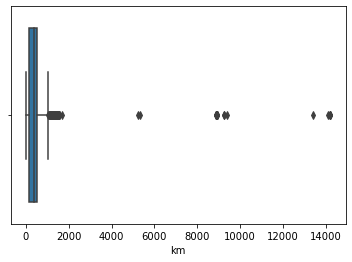

In [23]:
#Looking at the outliers
sns.boxplot(x=gdf_ds_dd['km'])

In [25]:
from scipy import stats

z = np.abs(stats.zscore(gdf_ds_dd['km']))
print(z)

[0.49113472 0.68464864 0.43626011 ... 0.18763684 0.36043618 0.37836593]


In [26]:
threshold = 3
print(np.where(z > 3))

(array([ 2096,  3382,  4179,  4226,  6009,  9630, 10244, 12702, 12819,
       13003, 13472, 13788, 15553, 16351, 17904, 17955, 18472, 18518,
       18701, 19429, 19900, 19946, 19953], dtype=int64),)


In [27]:
# Adding a z-score column to identify the outliers
gdf_ds_dd['z_score'] = zscore(gdf_ds_dd['km'])
gdf_ds_dd

,id,timest,Country,Province,City,Latitude_x,Longitude_x,geometry_x,poi_name,geometry_y,Latitude_y,Longitude_y,km,z_score
0,4516516,2017-06-21 00:00:00.143,CA,ON,Waterloo,43.49347,-80.49123,POINT (-80.49123 43.49347),POI3,POINT (-73.56602 45.52163),45.521629,-73.566024,594.764453,0.491135
1,4516547,2017-06-21 18:00:00.193,CA,ON,London,42.93990,-81.27090,POINT (-81.27090 42.93990),POI3,POINT (-73.56602 45.52163),45.521629,-73.566024,678.755025,0.684649
2,4516550,2017-06-21 15:00:00.287,CA,ON,Guelph,43.57760,-80.22010,POINT (-80.22010 43.57760),POI3,POINT (-73.56602 45.52163),45.521629,-73.566024,570.947304,0.436260
3,4516600,2017-06-21 15:00:00.307,CA,ON,Stratford,43.37160,-80.97730,POINT (-80.97730 43.37160),POI3,POINT (-73.56602 45.52163),45.521629,-73.566024,636.181718,0.586560
4,4516613,2017-06-21 15:00:00.497,CA,ON,Stratford,43.37160,-80.97730,POINT (-80.97730 43.37160),POI3,POINT (-73.56602 45.52163),45.521629,-73.566024,636.181718,0.586560
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22020,5614801,2017-06-21 12:23:07.880,CA,ON,Saint Catharines,43.16440,-79.24560,POINT (-79.24560 43.16440),POI3,POINT (-73.56602 45.52163),45.521629,-73.566024,523.007821,0.325808
22021,5614888,2017-06-21 08:23:01.793,CA,AB,Calgary,51.02093,-114.10621,POINT (-114.10621 51.02093),POI1,POINT (-113.48573 53.54617),53.546167,-113.485734,284.159333,-0.224498
22022,5614909,2017-06-21 00:23:07.903,CA,ON,Whitby,43.88730,-78.94220,POINT (-78.94220 43.88730),POI3,POINT (-73.56602 45.52163),45.521629,-73.566024,463.037698,0.187637
22023,5614912,2017-06-21 11:23:07.953,CA,ON,Oakville,43.49340,-79.71260,POINT (-79.71260 43.49340),POI3,POINT (-73.56602 45.52163),45.521629,-73.566024,538.037550,0.360436


In [28]:
filt1 = gdf_ds_dd['z_score'] < 3
gdf_ds_dd[filt1].count()

id             19976
timest         19976
Country        19976
Province       19976
City           19976
Latitude_x     19976
Longitude_x    19976
geometry_x     19976
poi_name       19976
geometry_y     19976
Latitude_y     19976
Longitude_y    19976
km             19976
z_score        19976
dtype: int64

In [29]:
gdf_ds_dd_f = gdf_ds_dd[filt1]
gdf_ds_dd_f

,id,timest,Country,Province,City,Latitude_x,Longitude_x,geometry_x,poi_name,geometry_y,Latitude_y,Longitude_y,km,z_score
0,4516516,2017-06-21 00:00:00.143,CA,ON,Waterloo,43.49347,-80.49123,POINT (-80.49123 43.49347),POI3,POINT (-73.56602 45.52163),45.521629,-73.566024,594.764453,0.491135
1,4516547,2017-06-21 18:00:00.193,CA,ON,London,42.93990,-81.27090,POINT (-81.27090 42.93990),POI3,POINT (-73.56602 45.52163),45.521629,-73.566024,678.755025,0.684649
2,4516550,2017-06-21 15:00:00.287,CA,ON,Guelph,43.57760,-80.22010,POINT (-80.22010 43.57760),POI3,POINT (-73.56602 45.52163),45.521629,-73.566024,570.947304,0.436260
3,4516600,2017-06-21 15:00:00.307,CA,ON,Stratford,43.37160,-80.97730,POINT (-80.97730 43.37160),POI3,POINT (-73.56602 45.52163),45.521629,-73.566024,636.181718,0.586560
4,4516613,2017-06-21 15:00:00.497,CA,ON,Stratford,43.37160,-80.97730,POINT (-80.97730 43.37160),POI3,POINT (-73.56602 45.52163),45.521629,-73.566024,636.181718,0.586560
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22020,5614801,2017-06-21 12:23:07.880,CA,ON,Saint Catharines,43.16440,-79.24560,POINT (-79.24560 43.16440),POI3,POINT (-73.56602 45.52163),45.521629,-73.566024,523.007821,0.325808
22021,5614888,2017-06-21 08:23:01.793,CA,AB,Calgary,51.02093,-114.10621,POINT (-114.10621 51.02093),POI1,POINT (-113.48573 53.54617),53.546167,-113.485734,284.159333,-0.224498
22022,5614909,2017-06-21 00:23:07.903,CA,ON,Whitby,43.88730,-78.94220,POINT (-78.94220 43.88730),POI3,POINT (-73.56602 45.52163),45.521629,-73.566024,463.037698,0.187637
22023,5614912,2017-06-21 11:23:07.953,CA,ON,Oakville,43.49340,-79.71260,POINT (-79.71260 43.49340),POI3,POINT (-73.56602 45.52163),45.521629,-73.566024,538.037550,0.360436


In [31]:
# Making linear connections & mapping them out
gdf_ds_dd_f['line'] = gdf_ds_dd_f.apply(lambda row: LineString([row['geometry_x'], row['geometry_y']]), axis=1)
lines_gdf = gdf_ds_dd_f[['id', 'poi_name', 'line']].set_geometry('line')

lines_gdf.set_crs("EPSG:4326")

<ipython-input-31-423b49c2c95c>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gdf_ds_dd_f['line'] = gdf_ds_dd_f.apply(lambda row: LineString([row['geometry_x'], row['geometry_y']]), axis=1)


,id,poi_name,line
0,4516516,POI3,"LINESTRING (-80.49123 43.49347, -73.56602 45.5..."
1,4516547,POI3,"LINESTRING (-81.27090 42.93990, -73.56602 45.5..."
2,4516550,POI3,"LINESTRING (-80.22010 43.57760, -73.56602 45.5..."
3,4516600,POI3,"LINESTRING (-80.97730 43.37160, -73.56602 45.5..."
4,4516613,POI3,"LINESTRING (-80.97730 43.37160, -73.56602 45.5..."
...,...,...,...
22020,5614801,POI3,"LINESTRING (-79.24560 43.16440, -73.56602 45.5..."
22021,5614888,POI1,"LINESTRING (-114.10621 51.02093, -113.48573 53..."
22022,5614909,POI3,"LINESTRING (-78.94220 43.88730, -73.56602 45.5..."
22023,5614912,POI3,"LINESTRING (-79.71260 43.49340, -73.56602 45.5..."


In [32]:
# Transforming to the acceptable coordinate system
lines_gdf.crs = 'epsg:4326'

In [34]:
# Creating a map to see what do we have
m = folium.Map([45.521629, -73.566024], zoom_start = 4, tiles='CartoDb dark_matter')
poi_m = zip(ds_grouped.Latitude_y, ds_grouped.Longitude_y)
ds_m = zip(gdf_ds_dd_f.Latitude_x, gdf_ds_dd_f.Longitude_x)

for location in ds_m:
    folium.CircleMarker(location=location, 
        color='yellow', radius=5).add_to(m)
    
for location in poi_m:
    folium.CircleMarker(location=location, 
        color='blue', radius=50, fill = True).add_to(m)    

for location in poi_m:
    folium.Circle(location=location, 
        color='blue', radius=1, fill = True).add_to(m)

folium.GeoJson(data = lines_gdf).add_to(m)
folium.LayerControl().add_to(m)
m

#linear elements can be removed via layer selection on the map

### The (Unfortunate) End

##### got stuck at 3.2, found that sklearn methods can be helpful with the proper classification & visualisation of nearest neighbours but it was a lot to process and implement. But I am still digging into that :)
